# **<h3 align="center"> Big Data Analytics - Project </h3>**
# **<h3 align="center">Stock Sentiment</h3>**
### **<h3 align="center">Prediction market behavior from US News Notebook</h3>**

**Group _ members:**<br>
Alexandra Pinto - 20211599@novaims.unl.pt - 20211599<br>
Steven Carlson - 20240554@novaims.unl.pt - 20240554<br>
Sven Goerdes - 20240503@novaims.unl.pt - 20240503<br>
Tim Straub - 20240505@novaims.unl.pt - 20240505<br>

# Table of Contents
1. Introduction  
2. Necessary Extensions and Imports
3. News Data Pipeline  
   - 3.1 Ingest and Inspect News Data  
   - 3.2 Group Articles by Day and Topic  
   - 3.3 TF-IDF Feature Extraction  
   - 3.4 Sentiment Analysis Using BERT  
4. News Data Pipeline   
5. Exploratory Data Analysis (EDA)  
6. Machine Learning  
7. Predictive Modeling  
8. Insights and Conclusions






# 1. Introduction

In this notebook, we analyze news articles from the New York Times over a 1-year period (April 2024 to April 2025). Our goal is to extract topic-specific features from headlines using TF-IDF and correlate them with market behavior (specifically, the SPY stock index). The main steps include:

- Pulling and storing NYT and SPY stock data
- Preprocessing and grouping headlines by topic and day
- Computing daily TF-IDF vectors per topic
- Generating pivot tables of article counts and TF-IDF values
- Joining with stock market data for correlation analysis


# 2. Necessary Extensions and Imports

In this section, we install any required extensions and import the necessary libraries to support the operations throughout the notebook, including data ingestion, processing, and analysis.



In [0]:
# Upgrade typing_extensions to a version MLflow expects
%pip install --upgrade typing_extensions

%pip install alpaca_trade_api

# Install (or reinstall) MLflow
%pip install --upgrade mlflow

#Since we decided to use XGBoost as an ml algorithm we need to also install
%pip install xgboost

# Restart the Python process so the new packages take effect
dbutils.library.restartPython()


import requests, json
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, year, month, dayofmonth, hour

from pyspark.sql import functions as F
from pyspark.sql.functions import to_timestamp, col, concat_ws, collect_list, count, window
from pyspark.ml import Pipeline
from pyspark.ml.feature import RegexTokenizer, StopWordsRemover, HashingTF, IDF
from pyspark.ml import PipelineModel

import alpaca_trade_api as tradeapi
from alpaca_trade_api.rest import REST
from pyspark.sql.functions import to_timestamp, year, month, dayofmonth

import os
os.environ["PYSPARK_PIN_THREAD"] = "false"

Python interpreter will be restarted.
Python interpreter will be restarted.
Python interpreter will be restarted.
Python interpreter will be restarted.
Python interpreter will be restarted.
Python interpreter will be restarted.
Python interpreter will be restarted.
Python interpreter will be restarted.


**!Only Run when all data sets are created!**

Reestablishes Hive lookups for the Delta tables

In [0]:
spark.sql(f"""
  CREATE TABLE IF NOT EXISTS nyt_archive
  USING DELTA
  LOCATION "/mnt/nyt/archive_yearly_delta"
""")

spark.sql(f"""
  CREATE TABLE IF NOT EXISTS news_tfidfs
  USING DELTA
  LOCATION "/mnt/nyt/news_tfidfs"
""")

spark.sql(f"""
  CREATE TABLE IF NOT EXISTS stock_daily
  USING DELTA
  LOCATION "/mnt/nyt/stock_daily"
""")

spark.sql(f"""
  CREATE TABLE IF NOT EXISTS stock_news_merged
  USING DELTA
  LOCATION "/mnt/nyt/stock_news_merged"
""")

spark.sql(f"""
  CREATE TABLE IF NOT EXISTS pagerank_by_day
  USING DELTA
  LOCATION "/mnt/nyt/pagerank_by_day"
""")

Out[1]: DataFrame[]

# 3. News Data Pipeline  

In the following cells, we will load and inspect the NYT headlines dataset
We start by reading the cleaned and partitioned news data from the Delta table `nyt_archive`.

It is also important to understand our use of first Delta and then Hive.
| Step                  | Component        | Purpose                                                                                                |
| --------------------- | ---------------- | ------------------------------------------------------------------------------------------------------ |
| **1. Save data**      | **Delta format** | Efficient, ACID-compliant storage of large datasets. We write the table with this format.                  |
| **2. Register table** | **Hive table**   | Adds a logical name (`nyt_archive`) to the Delta data so we can query it with SQL or `spark.table()`. |

We use Delta to store the data efficiently and Hive to make it easy to access and query. It’s the combination that gives us both performance and usability.

## 3.1. Ingest and Inspect News Data




In [0]:
# Register as a Hive table for easy querying
spark.sql(f"""
  CREATE TABLE IF NOT EXISTS nyt_archive
  USING DELTA
  LOCATION "/mnt/nyt/archive_yearly_delta"
""")


Out[2]: DataFrame[]

In [0]:
%sql
DESCRIBE DETAIL nyt_archive;

format,id,name,description,location,createdAt,lastModified,partitionColumns,numFiles,sizeInBytes,properties,minReaderVersion,minWriterVersion,tableFeatures,statistics
delta,9cc317ca-5d6e-4109-8eca-ccb1a81abceb,spark_catalog.default.nyt_archive,null,dbfs:/mnt/nyt/archive_yearly_delta,2025-06-04T11:59:29.408+0000,2025-06-04T12:02:01.000+0000,"List(yr, mo, dy, hr)",2682,4973777,Map(),1,2,"List(appendOnly, invariants)",Map()


In [0]:
# Deletes everything under that path, recursively
dbutils.fs.rm("/mnt/nyt/archive_yearly_delta", recurse=True)

Out[4]: True

In [0]:
# =============================
# NYTimes Archive Ingestion
# =============================

API_KEY     = "9cLqd9jAufochxZTdf3XW0MVh4mvzGIO"
BASE_URL    = "https://api.nytimes.com/svc/archive/v1"
DELTA_PATH  = "/mnt/nyt/archive_yearly_delta"   # final Delta store

# Importing required libraries
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, year, month, dayofmonth, hour
import requests
import json


# Let's Initialize Spark
spark = SparkSession.builder.getOrCreate()

# We define that the date range will: April 2024 → April 2025
start_year, start_month = 2025, 1
end_year,   end_month   = 2025, 4

months = []
y, m = start_year, start_month
while (y < end_year) or (y == end_year and m <= end_month):
    months.append((y, m))
    m += 1
    if m == 13:
        m = 1
        y += 1

# Loop and append each month’s headlines to Delta 
for y, m in months:
    url    = f"{BASE_URL}/{y}/{m}.json"
    params = {"api-key": API_KEY}

    resp = requests.get(url, params=params)
    resp.raise_for_status()
    docs = resp.json().get("response", {}).get("docs", [])
    if not docs:
        continue

    # parallelize & read JSON
    rdd = spark.sparkContext.parallelize([json.dumps(d) for d in docs])
    df  = spark.read.json(rdd)

    # Select only the relevant fields for analysis:
    # - 'headline': used for text analysis (TF-IDF, topic modeling)
    # - 'pub_date': used to align news with stock market timestamps
    # - 'section_name' (renamed as 'topic'): serves as a proxy for the topic/category of each article, we will also use this later to check if there is any correlation between topics and the target
    df_sel = df.select(
        col("headline.main").alias("headline"),
        col("pub_date").alias("pub_date"),
        col("section_name").alias("topic")
    )

    # add partition columns
    df_part = df_sel.withColumn("yr", year("pub_date")) \
                    .withColumn("mo", month("pub_date")) \
                    .withColumn("dy", dayofmonth("pub_date")) \
                    .withColumn("hr", hour("pub_date"))

    # write into Delta (append mode), partitioned
    df_part.write \
           .format("delta") \
           .mode("append") \
           .partitionBy("yr","mo","dy","hr") \
           .save(DELTA_PATH)

# 4) Register as a Hive table for easy querying
spark.sql(f"""
  CREATE TABLE IF NOT EXISTS nyt_archive
  USING DELTA
  LOCATION '{DELTA_PATH}'
""")

Out[5]: DataFrame[]

Now let's check the dataset.

In [0]:
# Verify by reading & displaying a sample
news_df = spark.table("nyt_archive")
display(news_df)

headline,pub_date,topic,yr,mo,dy,hr
Why Some Men Find Orgasms Elusive,2025-03-07T10:00:03+0000,Well,2025,3,7,10
How Do You Like Your History? With Imaginative Leaps or Grounded in Fact?,2025-03-07T10:00:10+0000,Books,2025,3,7,10
"For an Indian Textiles Designer, It Takes Many Villages",2025-03-07T10:00:17+0000,Arts,2025,3,7,10
"Bright Lights, Bot City: Having A.I. Plan a Dream Trip to New York",2025-03-07T10:00:25+0000,Travel,2025,3,7,10
"After an Abortion and a Separation, a 30-Something Flails Toward Adulthood",2025-03-07T10:00:25+0000,Books,2025,3,7,10
The Art World’s Next Big Thing: Tiny Paintings,2025-03-07T10:00:34+0000,T Magazine,2025,3,7,10
"One Fire, Two Burned Homes and Wildly Different Insurance Outcomes",2025-03-07T10:00:36+0000,Real Estate,2025,3,7,10
A Peeling 17th-Century Palazzo and the Man Who Was ‘Crazy Enough’ to Buy It,2025-03-07T10:00:47+0000,T Magazine,2025,3,7,10
A Hamas Leader’s Release From Prison Reopens Old Wounds in Israel,2025-03-07T10:00:55+0000,World,2025,3,7,10
5 Children’s Movies to Stream Now,2025-03-07T10:01:00+0000,Movies,2025,3,7,10


## 3.2. Group Articles by Day and Topic 
We tokenize, remove stopwords, apply hashing TF and compute IDF values to get sparse vector representations of topic-specific documents.


In [0]:
from pyspark.sql.functions import (
    to_timestamp,
    year,
    month,
    dayofmonth,
    window,        # <— import window
    col,           # <— import col
    collect_list,  # <— import collect_list
    concat_ws,
    count
)

articles = (
    spark
      .table("nyt_archive")
      .withColumn("timestamp", to_timestamp(col("pub_date")))
      .select("timestamp", "headline", "topic")
)

grouped = (
    articles
      .groupBy(
         window("timestamp", "24 hours").alias("time_window"),
         col("topic")
      )
      .agg(
         concat_ws(" ", collect_list("headline")).alias("document"),
         count("*").alias("article_count")
      )
      .select(
         col("time_window").getField("start").alias("window_start"),
         col("time_window").getField("end").alias("window_end"),
         "topic",
         "document",
         "article_count"
      )
      .orderBy("window_start", "topic")
)

grouped.show()


+-------------------+-------------------+------------------+--------------------+-------------+
|       window_start|         window_end|             topic|            document|article_count|
+-------------------+-------------------+------------------+--------------------+-------------+
|2025-01-01 00:00:00|2025-01-02 00:00:00|              Arts|The Acid Comedy o...|            5|
|2025-01-01 00:00:00|2025-01-02 00:00:00|             Books|The Secret Lives ...|            2|
|2025-01-01 00:00:00|2025-01-02 00:00:00|          Briefing|Wednesday Briefin...|            3|
|2025-01-01 00:00:00|2025-01-02 00:00:00|      Business Day|China’s Leader No...|            1|
|2025-01-01 00:00:00|2025-01-02 00:00:00|       Corrections|Quote of the Day:...|            2|
|2025-01-01 00:00:00|2025-01-02 00:00:00|Crosswords & Games|Spelling Bee Foru...|            4|
|2025-01-01 00:00:00|2025-01-02 00:00:00|              Food|My One-Pan Orzo W...|            1|
|2025-01-01 00:00:00|2025-01-02 00:00:00

## 3.2. Compute TF-IDF Features
We tokenize, remove stopwords, apply hashing TF and compute IDF values to get sparse vector representations of topic-specific documents.

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.functions import size, when, col
from pyspark.ml import Pipeline
from pyspark.ml.feature import RegexTokenizer, StopWordsRemover, HashingTF, IDF

# ------------------------------
# 1) Define your TF–IDF pipeline
# ------------------------------
tokenizer = RegexTokenizer(inputCol="document", outputCol="words", pattern="\\W+")
stopper   = StopWordsRemover(inputCol="words", outputCol="filtered")
hashTF    = HashingTF(inputCol="filtered", outputCol="rawFeatures", numFeatures=1<<14)
idf       = IDF(inputCol="rawFeatures", outputCol="tfidfFeatures")

tfidf_pipeline = Pipeline(stages=[tokenizer, stopper, hashTF, idf])

# --------------------------------------------
# 2) Fit on your grouped DataFrame and transform
# --------------------------------------------
tfidf_model = tfidf_pipeline.fit(grouped)
tfidf_df    = tfidf_model.transform(grouped)

# -------------------------------------------------------------------
# 3) Now force `tfidfFeatures = NULL` whenever `filtered` is empty (size=0)
# -------------------------------------------------------------------
tfidf_df = tfidf_df.withColumn(
    "tfidfFeatures",
    when(size(col("filtered")) == 0, None)    # replace with null if no tokens
    .otherwise(col("tfidfFeatures"))
)


## 3.3. Pivot Data for Analysis
We create wide-format tables for both article counts and TF-IDF vectors, which will later be used for correlation analysis.

In [0]:
spark.sql(f"""
  CREATE TABLE IF NOT EXISTS news_tfidfs
  USING DELTA
  LOCATION "/mnt/nyt/news_tfidfs"
""")

Out[9]: DataFrame[]

In [0]:
%sql
DESCRIBE DETAIL news_tfidfs

format,id,name,description,location,createdAt,lastModified,partitionColumns,numFiles,sizeInBytes,properties,minReaderVersion,minWriterVersion,tableFeatures,statistics
delta,e850a854-23bc-4aab-8dc8-557aeb237e1b,spark_catalog.default.news_tfidfs,null,dbfs:/mnt/nyt/news_tfidfs,2025-06-04T12:12:11.095+0000,2025-06-04T12:16:26.000+0000,List(),1,555680,Map(),1,2,"List(appendOnly, invariants)",Map()


In [0]:
# Deletes everything under that path, recursively
dbutils.fs.rm("/mnt/nyt/news_tfidfs", recurse=True)

Out[11]: True

In [0]:
import re  # For the sanitize() function

from pyspark.sql.functions import (
    col,
    first,
    to_timestamp,
    concat_ws,
    collect_list,
    count,
    window
)
# Helper to make column‐safe names
def sanitize(name: str) -> str:
    # replace non-alphanumeric with underscore, collapse multiple, strip edges
    s = re.sub(r'\W+', '_', name)
    return re.sub(r'_+', '_', s).strip('_')

# Pivot article counts
counts_pivot = (
    tfidf_df
      .groupBy("window_start", "window_end")
      .pivot("topic")
      .agg(first("article_count"))            
)

# Pivot TF-IDF vectors
tfidf_pivot = (
    tfidf_df
      .groupBy("window_start", "window_end")
      .pivot("topic")
      .agg(first("tfidfFeatures"))
)

# Rename columns to more understandable names and add appropriate prefixes
counts_safe = counts_pivot
for col_name in counts_pivot.columns:
    if col_name not in ("window_start", "window_end"):
        safe = sanitize(col_name)
        counts_safe = counts_safe.withColumnRenamed(col_name, f"count_{safe}")

tfidf_safe = tfidf_pivot
for col_name in tfidf_pivot.columns:
    if col_name not in ("window_start", "window_end"):
        safe = sanitize(col_name)
        tfidf_safe = tfidf_safe.withColumnRenamed(col_name, f"tfidf_{safe}")

# Join the two
final_df = counts_safe.join(
    tfidf_safe,
    on=["window_start", "window_end"],
    how="inner"
)

# Persist and register
OUT_PATH = "/mnt/nyt/news_tfidfs"

(
    final_df
      .write
      .format("delta")
      .mode("overwrite")
      .option("overwriteSchema", "true")
      .save(OUT_PATH)
)

spark.sql(f"""
  CREATE TABLE IF NOT EXISTS news_tfidfs
  USING DELTA
  LOCATION '{OUT_PATH}'
""")

Out[12]: DataFrame[]

Let's open the dataset.


In [0]:
# Show schema & sampler
# Display a sample of the data
news_tfidfs = spark.table("news_tfidfs")
display(news_tfidfs.limit(10))


window_start window_end count_ count_Arts count_Automobiles count_Books count_Briefing count_Business_Day count_Climate count_Corrections count_Crosswords_Games count_Education count_Fashion_Style count_Food count_Headway count_Health count_International_Home count_Lens count_Magazine count_Movies count_New_York count_Obituaries count_Opinion count_Podcasts count_Polls count_Reader_Center count_Real_Estate count_Science count_Sports count_Style count_T_Brand count_T_Magazine count_Technology count_The_Learning_Network count_The_Upshot count_Theater count_Times_Insider count_Travel count_U_S count_Weather count_Well count_World count_Your_Money count_en_Español tfidf_ tfidf_Arts tfidf_Automobiles tfidf_Books tfidf_Briefing tfidf_Business_Day tfidf_Climate tfidf_Corrections tfidf_Crosswords_Games tfidf_Education tfidf_Fashion_Style tfidf_Food tfidf_Headway tfidf_Health tfidf_International_Home tfidf_Lens tfidf_Magazine tfidf_Movies tfidf_New_York tfidf_Obituaries tfidf_Opinion tfidf_Podcasts tfidf_Polls tfidf_Reader_Center tfidf_Real_Estate tfidf_Science tfidf_Sports tfidf_Style tfidf_T_Brand tfidf_T_Magazine tfidf_Technology tfidf_The_Learning_Network tfidf_The_Upshot tfidf_Theater tfidf_Times_Insider tfidf_Travel tfidf_U_S tfidf_Weather tfidf_Well tfidf_World tfidf_Your_Money tfidf_en_Español 2025-02-05T00:00:00.000+0000 2025-02-06T00:00:00.000+0000 null 11 null 5 4 13 null 2 5 null null 4 null 3 null null 5 3 8 null 12 4 null null 2 4 1 6 null null 3 3 1 2 null 2 50 2 2 22 null null null Map(vectorType -> sparse, length -> 16384, indices -> List(46, 189, 307, 363, 503, 628, 846, 972, 1525, 1586, 1945, 1957, 2066, 2108, 2166, 2187, 2195, 2295, 2526, 2736, 2888, 3083, 3283, 3561, 4001, 4686, 4719, 4744, 4795, 5672, 6256, 6456, 6972, 7134, 7342, 7625, 7797, 7913, 8025, 8086, 8735, 9187, 9331, 10374, 10389, 10506, 10755, 10852, 10875, 11130, 11160, 11519, 12112, 12138, 12342, 12364, 12409, 12906, 13178, 13283, 14093, 14429, 14521, 14739, 15181, 15874, 15910, 16064, 16108, 16315), values -> List(3.549279263362161, 3.124396069396895, 4.495422958385997, 7.298783339292532, 5.912488978172641, 4.856436303923328, 4.856436303923328, 6.200171050624422, 3.5145937053742706, 6.8933182311843675, 3.291450154060061, 4.659726009677273, 4.120729508944586, 3.7152644008364217, 6.8933182311843675, 3.6481250979987934, 5.42698116239094, 4.696093653848148, 4.002946473288203, 5.912488978172641, 4.303051065738541, 5.507023870064477, 5.689345426858432, 4.557943315367331, 3.3572015316228416, 6.605636158732587, 6.605636158732587, 4.624634689866003, 4.230730404158915, 6.382492607418377, 3.1716489542474404, 6.046020370797164, 6.200171050624422, 5.047491540686036, 7.298783339292532, 4.465569995236316, 3.124396069396895, 2.9544356579598947, 3.5260224011978933, 5.352873190237219, 4.428556393259641, 4.381012607208253, 7.298783339292532, 4.141782918142419, 5.352873190237219, 5.689345426858432, 3.9488792520179268, 3.492120849522212, 4.900888066494161, 6.046020370797164, 5.101558761956312, 6.382492607418377, 4.495422958385997, 4.659726009677273, 4.141782918142419, 7.298783339292532, 4.021638606300355, 3.32849142574041, 6.605636158732587, 5.594035247054107, 4.813876689504531, 3.802275777826052, 3.2645427011401367, 5.507023870064477, 5.158717175796261, 3.881056655679166, 4.733833981830995, 4.328368873722831, 8.370536060164316, 4.141782918142419)) null Map(vectorType -> sparse, length -> 16384, indices -> List(296, 893, 2680, 3626, 5014, 5186, 5755, 5809, 6368, 6445, 7571, 7806, 8145, 8273, 8889, 9048, 9499, 9958, 9976, 10483, 10570, 10666, 10852, 12126, 12471, 12515, 12677, 13785, 13823, 14860, 15067, 15851, 15993), values -> List(6.605636158732587, 4.100110221741851, 5.101558761956312, 4.4365824583630635, 4.557943315367331, 4.4365824583630635, 6.382492607418377, 3.376810003011218, 6.200171050624422, 3.881056655679166, 6.200171050624422, 3.6099038851785954, 4.185268030082158, 4.254260901569109, 7.933157658234656, 3.043170629474309, 4.2783584531481695, 3.88105665567916

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.functions import col, when
from pyspark.sql.types import StructType  # used only for type check
from pyspark.ml.linalg import Vectors, VectorUDT
from pyspark.sql.functions import udf

# Read the Delta table
df = spark.table("news_tfidfs")

df = df.fillna(0)

# 2) Identify all 'tfidf_' columns of Vector type
vector_tfidf_cols = [
    field.name
    for field in df.schema.fields
    if field.name.startswith("tfidf_") and isinstance(field.dataType, VectorUDT)
]

# 3) Construct a zero‐vector of length 16384 (matching your HashingTF numFeatures)
zero_vec = Vectors.sparse(16384, [], [])

# 4) Define a UDF that returns zero_vec when the input is null, else returns the original vector
fill_zero_udf = udf(lambda v: zero_vec if v is None else v, VectorUDT())

# 5) Apply the UDF for each tfidf_ column to replace null with the zero vector
df_filled = df
for col_name in vector_tfidf_cols:
    df_filled = df_filled.withColumn(col_name, fill_zero_udf(col(col_name)))

# 6) Overwrite the Delta table with the null‐filled DataFrame (including schema overwrite)
(
    df_filled
      .write
      .format("delta")
      .mode("overwrite")
      .option("overwriteSchema", "true")
      .saveAsTable("news_tfidfs")
)

display(df_filled.limit(10))

window_start window_end count_ count_Arts count_Automobiles count_Books count_Briefing count_Business_Day count_Climate count_Corrections count_Crosswords_Games count_Education count_Fashion_Style count_Food count_Headway count_Health count_International_Home count_Lens count_Magazine count_Movies count_New_York count_Obituaries count_Opinion count_Podcasts count_Polls count_Reader_Center count_Real_Estate count_Science count_Sports count_Style count_T_Brand count_T_Magazine count_Technology count_The_Learning_Network count_The_Upshot count_Theater count_Times_Insider count_Travel count_U_S count_Weather count_Well count_World count_Your_Money count_en_Español tfidf_ tfidf_Arts tfidf_Automobiles tfidf_Books tfidf_Briefing tfidf_Business_Day tfidf_Climate tfidf_Corrections tfidf_Crosswords_Games tfidf_Education tfidf_Fashion_Style tfidf_Food tfidf_Headway tfidf_Health tfidf_International_Home tfidf_Lens tfidf_Magazine tfidf_Movies tfidf_New_York tfidf_Obituaries tfidf_Opinion tfidf_Podcasts tfidf_Polls tfidf_Reader_Center tfidf_Real_Estate tfidf_Science tfidf_Sports tfidf_Style tfidf_T_Brand tfidf_T_Magazine tfidf_Technology tfidf_The_Learning_Network tfidf_The_Upshot tfidf_Theater tfidf_Times_Insider tfidf_Travel tfidf_U_S tfidf_Weather tfidf_Well tfidf_World tfidf_Your_Money tfidf_en_Español 2025-02-05T00:00:00.000+0000 2025-02-06T00:00:00.000+0000 0 11 0 5 4 13 0 2 5 0 0 4 0 3 0 0 5 3 8 0 12 4 0 0 2 4 1 6 0 0 3 3 1 2 0 2 50 2 2 22 0 0 Map(vectorType -> sparse, length -> 16384, indices -> List(), values -> List()) Map(vectorType -> sparse, length -> 16384, indices -> List(46, 189, 307, 363, 503, 628, 846, 972, 1525, 1586, 1945, 1957, 2066, 2108, 2166, 2187, 2195, 2295, 2526, 2736, 2888, 3083, 3283, 3561, 4001, 4686, 4719, 4744, 4795, 5672, 6256, 6456, 6972, 7134, 7342, 7625, 7797, 7913, 8025, 8086, 8735, 9187, 9331, 10374, 10389, 10506, 10755, 10852, 10875, 11130, 11160, 11519, 12112, 12138, 12342, 12364, 12409, 12906, 13178, 13283, 14093, 14429, 14521, 14739, 15181, 15874, 15910, 16064, 16108, 16315), values -> List(3.549279263362161, 3.124396069396895, 4.495422958385997, 7.298783339292532, 5.912488978172641, 4.856436303923328, 4.856436303923328, 6.200171050624422, 3.5145937053742706, 6.8933182311843675, 3.291450154060061, 4.659726009677273, 4.120729508944586, 3.7152644008364217, 6.8933182311843675, 3.6481250979987934, 5.42698116239094, 4.696093653848148, 4.002946473288203, 5.912488978172641, 4.303051065738541, 5.507023870064477, 5.689345426858432, 4.557943315367331, 3.3572015316228416, 6.605636158732587, 6.605636158732587, 4.624634689866003, 4.230730404158915, 6.382492607418377, 3.1716489542474404, 6.046020370797164, 6.200171050624422, 5.047491540686036, 7.298783339292532, 4.465569995236316, 3.124396069396895, 2.9544356579598947, 3.5260224011978933, 5.352873190237219, 4.428556393259641, 4.381012607208253, 7.298783339292532, 4.141782918142419, 5.352873190237219, 5.689345426858432, 3.9488792520179268, 3.492120849522212, 4.900888066494161, 6.046020370797164, 5.101558761956312, 6.382492607418377, 4.495422958385997, 4.659726009677273, 4.141782918142419, 7.298783339292532, 4.021638606300355, 3.32849142574041, 6.605636158732587, 5.594035247054107, 4.813876689504531, 3.802275777826052, 3.2645427011401367, 5.507023870064477, 5.158717175796261, 3.881056655679166, 4.733833981830995, 4.328368873722831, 8.370536060164316, 4.141782918142419)) Map(vectorType -> sparse, length -> 16384, indices -> List(), values -> List()) Map(vectorType -> sparse, length -> 16384, indices -> List(296, 893, 2680, 3626, 5014, 5186, 5755, 5809, 6368, 6445, 7571, 7806, 8145, 8273, 8889, 9048, 9499, 9958, 9976, 10483, 10570, 10666, 10852, 12126, 12471, 12515, 12677, 13785, 13823, 14860, 15067, 15851, 15993), values -> List(6.605636158732587, 4.100110221741851, 5.101558761956312, 4.4365824583630635, 4.557943315367331, 4.4365824583630635, 6.382492607418377, 3.376810003011218, 6.200171050624422, 3.881056655679166, 6.200171050624422, 3.6099038851785954, 4.18526803

## 3.4. Sentiment Analysis Using Bert

Initially, we explored using an external API to retrieve sentiment labels for the news headlines. However, due to technical issues and limited control over the output, we decided to perform sentiment analysis independently using a pre-trained BERT model.

In this step, we apply BERT to assign sentiment scores (e.g., positive, neutral, negative) to each headline. Since we don't have a labeled target to validate the sentiment predictions against, we treat this as an exploratory, unsupervised analysis. The results should be interpreted with caution, but they allow us to experiment with integrating pre-trained models in Databricks and enhance our understanding of the emotional tone of the news data.


In [0]:
### CODE :)

# 4. Stock Data Pipeline 
We read the daily S&P data for the SPY index from the table `stock_daily`.


In [0]:
spark.sql(f"""
  CREATE TABLE IF NOT EXISTS stock_daily
  USING DELTA
  LOCATION "/mnt/nyt/stock_daily"
""")

Out[15]: DataFrame[]

In [0]:
%sql
DESCRIBE DETAIL stock_daily

format,id,name,description,location,createdAt,lastModified,partitionColumns,numFiles,sizeInBytes,properties,minReaderVersion,minWriterVersion,tableFeatures,statistics
delta,8fa73412-b0bd-4a79-987f-d24d3afbabba,spark_catalog.default.stock_daily,null,dbfs:/mnt/nyt/stock_daily,2025-06-04T12:16:35.072+0000,2025-06-04T12:16:55.000+0000,"List(yr, mo, dy)",81,196551,Map(),1,2,"List(appendOnly, invariants)",Map()


In [0]:
# Deletes everything under that path, recursively
dbutils.fs.rm("/mnt/nyt/stock_daily", recurse=True)

Out[17]: True

In [0]:
import alpaca_trade_api as tradeapi
from alpaca_trade_api.rest import REST
from pyspark.sql.functions import to_timestamp, year, month, dayofmonth

# ----------------------------
# Pull daily SPY bars
# ----------------------------
client = REST(
    "PKY96P1SK8M1NUKCCYSC",
    "Uf15nvt1cNm61OVbKudbnmwqhW155pr3PtdaB4gR",
    base_url="https://data.alpaca.markets",
    api_version="v2"
)

bars = client.get_bars(
    "SPY",
    tradeapi.TimeFrame(1, tradeapi.TimeFrameUnit.Day),
    start="2025-01-01",
    end="2025-04-30"
)
pdf = bars.df.reset_index().rename(columns={"index": "timestamp"})

# ✅ Keep timestamp column here
stock_df = (
    spark.createDataFrame(pdf)
          .withColumn("timestamp", to_timestamp("timestamp"))
)

# Add partition columns for efficient Delta storage
stock_part = (
    stock_df
      .withColumn("yr", year("timestamp"))
      .withColumn("mo", month("timestamp"))
      .withColumn("dy", dayofmonth("timestamp"))
)

# Save to Delta and register table
DELTA_STOCK_PATH = "/mnt/nyt/stock_daily"

stock_part.write \
    .format("delta") \
    .mode("overwrite") \
    .partitionBy("yr", "mo", "dy") \
    .save(DELTA_STOCK_PATH)

spark.sql(f"""
  CREATE TABLE IF NOT EXISTS stock_daily
  USING DELTA
  LOCATION '{DELTA_STOCK_PATH}'
""")
import alpaca_trade_api as tradeapi
from alpaca_trade_api.rest import REST
from pyspark.sql.functions import to_timestamp, year, month, dayofmonth

# ----------------------------
# Pull daily SPY bars
# ----------------------------
client = REST(
    "PKY96P1SK8M1NUKCCYSC",
    "Uf15nvt1cNm61OVbKudbnmwqhW155pr3PtdaB4gR",
    base_url="https://data.alpaca.markets",
    api_version="v2"
)

bars = client.get_bars(
    "SPY",
    tradeapi.TimeFrame(1, tradeapi.TimeFrameUnit.Day),
    start="2025-01-01",
    end="2025-04-30"
)
pdf = bars.df.reset_index().rename(columns={"index": "timestamp"})

# ✅ Keep timestamp column here
stock_df = (
    spark.createDataFrame(pdf)
          .withColumn("timestamp", to_timestamp("timestamp"))
)

# Add partition columns for efficient Delta storage
stock_part = (
    stock_df
      .withColumn("yr", year("timestamp"))
      .withColumn("mo", month("timestamp"))
      .withColumn("dy", dayofmonth("timestamp"))
)

# Save to Delta and register table
DELTA_STOCK_PATH = "/mnt/nyt/stock_daily"

stock_part.write \
    .format("delta") \
    .mode("overwrite") \
    .partitionBy("yr", "mo", "dy") \
    .save(DELTA_STOCK_PATH)

spark.sql(f"""
  CREATE TABLE IF NOT EXISTS stock_daily
  USING DELTA
  LOCATION '{DELTA_STOCK_PATH}'
""")


Out[18]: DataFrame[]

Let's open the dataframe.

In [0]:

stock = spark.table("stock_daily")
display(stock.orderBy("timestamp").limit(10))

timestamp,close,high,low,trade_count,open,volume,vwap,yr,mo,dy
2025-01-02T05:00:00.000+0000,584.64,591.13,580.5,603951,589.39,50203975,585.069059,2025,1,2
2025-01-03T05:00:00.000+0000,591.95,592.6,586.43,427267,587.53,37888459,590.3249,2025,1,3
2025-01-06T05:00:00.000+0000,595.36,599.7,593.6,468834,596.27,47679442,596.616783,2025,1,6
2025-01-07T05:00:00.000+0000,588.63,597.75,586.78,489809,597.42,60393052,591.010705,2025,1,7
2025-01-08T05:00:00.000+0000,589.49,590.5799,585.195,432460,588.7,47304672,588.281771,2025,1,8
2025-01-10T05:00:00.000+0000,580.49,585.95,578.55,720924,585.88,73105046,581.355095,2025,1,10
2025-01-13T05:00:00.000+0000,581.39,581.75,575.35,505933,575.77,47910060,578.886779,2025,1,13
2025-01-14T05:00:00.000+0000,582.19,585.0,578.35,473554,584.36,48420580,581.845057,2025,1,14
2025-01-15T05:00:00.000+0000,592.78,593.94,589.195,488787,590.325,56900159,592.171696,2025,1,15
2025-01-16T05:00:00.000+0000,591.64,594.35,590.93,409217,594.175,44319662,592.628159,2025,1,16


# 5. Merging News and Stock Data

Before diving into Exploratory Data Analysis (EDA), we need to merge the datasets that we've built so far, specifically, the processed news data (with TF-IDF, article counts, and sentiment) and the stock market data (SPY daily prices). This combined dataset will allow us to explore how different news features relate to market behavior.

The merged dataset will include:
- Time-based alignment (by day)
- News features: article count per topic, TF-IDF vectors, sentiment scores
- Market target variable: daily SPY return or price movement

This step ensures all our features and targets are in one place for analysis and modeling.


In [0]:
from pyspark.sql.functions import to_date, col

# 1) Read directly from the Hive tables
stock_df = spark.table("stock_daily")
news_df  = spark.table("news_tfidfs")

# 2) Extract just the DATE part of each timestamp
stock_df = stock_df.withColumn("trade_date", to_date(col("timestamp")))
news_df  = news_df .withColumn("news_date",  to_date(col("window_start")))

# 3) Join on trade_date = news_date (inner join)
merged_df = (
    stock_df
      .join(news_df, stock_df.trade_date == news_df.news_date, "inner")
      .drop("trade_date", "news_date")
)

merged_df = merged_df.drop("yr", "mo", "dy", "window_start", "window_end")

display(merged_df.limit(10))


timestamp close high low trade_count open volume vwap count_ count_Arts count_Automobiles count_Books count_Briefing count_Business_Day count_Climate count_Corrections count_Crosswords_Games count_Education count_Fashion_Style count_Food count_Headway count_Health count_International_Home count_Lens count_Magazine count_Movies count_New_York count_Obituaries count_Opinion count_Podcasts count_Polls count_Reader_Center count_Real_Estate count_Science count_Sports count_Style count_T_Brand count_T_Magazine count_Technology count_The_Learning_Network count_The_Upshot count_Theater count_Times_Insider count_Travel count_U_S count_Weather count_Well count_World count_Your_Money count_en_Español tfidf_ tfidf_Arts tfidf_Automobiles tfidf_Books tfidf_Briefing tfidf_Business_Day tfidf_Climate tfidf_Corrections tfidf_Crosswords_Games tfidf_Education tfidf_Fashion_Style tfidf_Food tfidf_Headway tfidf_Health tfidf_International_Home tfidf_Lens tfidf_Magazine tfidf_Movies tfidf_New_York tfidf_Obituaries tfidf_Opinion tfidf_Podcasts tfidf_Polls tfidf_Reader_Center tfidf_Real_Estate tfidf_Science tfidf_Sports tfidf_Style tfidf_T_Brand tfidf_T_Magazine tfidf_Technology tfidf_The_Learning_Network tfidf_The_Upshot tfidf_Theater tfidf_Times_Insider tfidf_Travel tfidf_U_S tfidf_Weather tfidf_Well tfidf_World tfidf_Your_Money tfidf_en_Español 2025-02-05T05:00:00.000+0000 604.22 604.37 598.58 358145 600.64 30653149 602.220255 0 11 0 5 4 13 0 2 5 0 0 4 0 3 0 0 5 3 8 0 12 4 0 0 2 4 1 6 0 0 3 3 1 2 0 2 50 2 2 22 0 0 Map(vectorType -> sparse, length -> 16384, indices -> List(), values -> List()) Map(vectorType -> sparse, length -> 16384, indices -> List(46, 189, 307, 363, 503, 628, 846, 972, 1525, 1586, 1945, 1957, 2066, 2108, 2166, 2187, 2195, 2295, 2526, 2736, 2888, 3083, 3283, 3561, 4001, 4686, 4719, 4744, 4795, 5672, 6256, 6456, 6972, 7134, 7342, 7625, 7797, 7913, 8025, 8086, 8735, 9187, 9331, 10374, 10389, 10506, 10755, 10852, 10875, 11130, 11160, 11519, 12112, 12138, 12342, 12364, 12409, 12906, 13178, 13283, 14093, 14429, 14521, 14739, 15181, 15874, 15910, 16064, 16108, 16315), values -> List(3.549279263362161, 3.124396069396895, 4.495422958385997, 7.298783339292532, 5.912488978172641, 4.856436303923328, 4.856436303923328, 6.200171050624422, 3.5145937053742706, 6.8933182311843675, 3.291450154060061, 4.659726009677273, 4.120729508944586, 3.7152644008364217, 6.8933182311843675, 3.6481250979987934, 5.42698116239094, 4.696093653848148, 4.002946473288203, 5.912488978172641, 4.303051065738541, 5.507023870064477, 5.689345426858432, 4.557943315367331, 3.3572015316228416, 6.605636158732587, 6.605636158732587, 4.624634689866003, 4.230730404158915, 6.382492607418377, 3.1716489542474404, 6.046020370797164, 6.200171050624422, 5.047491540686036, 7.298783339292532, 4.465569995236316, 3.124396069396895, 2.9544356579598947, 3.5260224011978933, 5.352873190237219, 4.428556393259641, 4.381012607208253, 7.298783339292532, 4.141782918142419, 5.352873190237219, 5.689345426858432, 3.9488792520179268, 3.492120849522212, 4.900888066494161, 6.046020370797164, 5.101558761956312, 6.382492607418377, 4.495422958385997, 4.659726009677273, 4.141782918142419, 7.298783339292532, 4.021638606300355, 3.32849142574041, 6.605636158732587, 5.594035247054107, 4.813876689504531, 3.802275777826052, 3.2645427011401367, 5.507023870064477, 5.158717175796261, 3.881056655679166, 4.733833981830995, 4.328368873722831, 8.370536060164316, 4.141782918142419)) Map(vectorType -> sparse, length -> 16384, indices -> List(), values -> List()) Map(vectorType -> sparse, length -> 16384, indices -> List(296, 893, 2680, 3626, 5014, 5186, 5755, 5809, 6368, 6445, 7571, 7806, 8145, 8273, 8889, 9048, 9499, 9958, 9976, 10483, 10570, 10666, 10852, 12126, 12471, 12515, 12677, 13785, 13823, 14860, 15067, 15851, 15993), values -> List(6.605636158732587, 4.100110221741851, 5.101558761956312, 4.4365824583630635, 4.557943315367331, 4.4365824583630635, 6.382492607418377, 3.376810003011218, 6.200171050624422, 3.8810566556

In [0]:
# # Persist and register
# OUT_PATH = "/mnt/nyt/stock_news_merged"

# (
#     merged_df
#       .write
#       .format("delta")
#       .mode("overwrite")
#       .option("overwriteSchema", "true")
#       .save(OUT_PATH)
# )

# spark.sql(f"""
#   CREATE TABLE IF NOT EXISTS stock_news_merged
#   USING DELTA
#   LOCATION '{OUT_PATH}'
# """)

In [0]:
merged = spark.table("stock_news_merged")
display(merged.limit(3))

timestamp close high low trade_count open volume vwap count_ count_Arts count_Automobiles count_Books count_Briefing count_Business_Day count_Climate count_Corrections count_Crosswords_Games count_Education count_Fashion_Style count_Food count_Headway count_Health count_International_Home count_Lens count_Magazine count_Movies count_New_York count_Obituaries count_Opinion count_Podcasts count_Polls count_Reader_Center count_Real_Estate count_Science count_Sports count_Style count_T_Brand count_T_Magazine count_Technology count_The_Learning_Network count_The_Upshot count_Theater count_Times_Insider count_Travel count_U_S count_Weather count_Well count_World count_Your_Money count_en_Español tfidf_ tfidf_Arts tfidf_Automobiles tfidf_Books tfidf_Briefing tfidf_Business_Day tfidf_Climate tfidf_Corrections tfidf_Crosswords_Games tfidf_Education tfidf_Fashion_Style tfidf_Food tfidf_Headway tfidf_Health tfidf_International_Home tfidf_Lens tfidf_Magazine tfidf_Movies tfidf_New_York tfidf_Obituaries tfidf_Opinion tfidf_Podcasts tfidf_Polls tfidf_Reader_Center tfidf_Real_Estate tfidf_Science tfidf_Sports tfidf_Style tfidf_T_Brand tfidf_T_Magazine tfidf_Technology tfidf_The_Learning_Network tfidf_The_Upshot tfidf_Theater tfidf_Times_Insider tfidf_Travel tfidf_U_S tfidf_Weather tfidf_Well tfidf_World tfidf_Your_Money tfidf_en_Español 2025-02-05T05:00:00.000+0000 604.22 604.37 598.58 358145 600.64 30653149 602.220255 0 11 0 5 4 13 0 2 5 0 0 4 0 3 0 0 5 3 8 0 12 4 0 0 2 4 1 6 0 0 3 3 1 2 0 2 50 2 2 22 0 0 Map(vectorType -> sparse, length -> 16384, indices -> List(), values -> List()) Map(vectorType -> sparse, length -> 16384, indices -> List(46, 189, 307, 363, 503, 628, 846, 972, 1525, 1586, 1945, 1957, 2066, 2108, 2166, 2187, 2195, 2295, 2526, 2736, 2888, 3083, 3283, 3561, 4001, 4686, 4719, 4744, 4795, 5672, 6256, 6456, 6972, 7134, 7342, 7625, 7797, 7913, 8025, 8086, 8735, 9187, 9331, 10374, 10389, 10506, 10755, 10852, 10875, 11130, 11160, 11519, 12112, 12138, 12342, 12364, 12409, 12906, 13178, 13283, 14093, 14429, 14521, 14739, 15181, 15874, 15910, 16064, 16108, 16315), values -> List(3.549279263362161, 3.124396069396895, 4.495422958385997, 7.298783339292532, 5.912488978172641, 4.856436303923328, 4.856436303923328, 6.200171050624422, 3.5145937053742706, 6.8933182311843675, 3.291450154060061, 4.659726009677273, 4.120729508944586, 3.7152644008364217, 6.8933182311843675, 3.6481250979987934, 5.42698116239094, 4.696093653848148, 4.002946473288203, 5.912488978172641, 4.303051065738541, 5.507023870064477, 5.689345426858432, 4.557943315367331, 3.3572015316228416, 6.605636158732587, 6.605636158732587, 4.624634689866003, 4.230730404158915, 6.382492607418377, 3.1716489542474404, 6.046020370797164, 6.200171050624422, 5.047491540686036, 7.298783339292532, 4.465569995236316, 3.124396069396895, 2.9544356579598947, 3.5260224011978933, 5.352873190237219, 4.428556393259641, 4.381012607208253, 7.298783339292532, 4.141782918142419, 5.352873190237219, 5.689345426858432, 3.9488792520179268, 3.492120849522212, 4.900888066494161, 6.046020370797164, 5.101558761956312, 6.382492607418377, 4.495422958385997, 4.659726009677273, 4.141782918142419, 7.298783339292532, 4.021638606300355, 3.32849142574041, 6.605636158732587, 5.594035247054107, 4.813876689504531, 3.802275777826052, 3.2645427011401367, 5.507023870064477, 5.158717175796261, 3.881056655679166, 4.733833981830995, 4.328368873722831, 8.370536060164316, 4.141782918142419)) Map(vectorType -> sparse, length -> 16384, indices -> List(), values -> List()) Map(vectorType -> sparse, length -> 16384, indices -> List(296, 893, 2680, 3626, 5014, 5186, 5755, 5809, 6368, 6445, 7571, 7806, 8145, 8273, 8889, 9048, 9499, 9958, 9976, 10483, 10570, 10666, 10852, 12126, 12471, 12515, 12677, 13785, 13823, 14860, 15067, 15851, 15993), values -> List(6.605636158732587, 4.100110221741851, 5.101558761956312, 4.4365824583630635, 4.557943315367331, 4.4365824583630635, 6.382492607418377, 3.376810003011218, 6.200171050624422, 3.8810566556

We can also check the columns names.

In [0]:
merged.printSchema()


root
 |-- timestamp: timestamp (nullable = true)
 |-- close: double (nullable = true)
 |-- high: double (nullable = true)
 |-- low: double (nullable = true)
 |-- trade_count: long (nullable = true)
 |-- open: double (nullable = true)
 |-- volume: long (nullable = true)
 |-- vwap: double (nullable = true)
 |-- count_: long (nullable = true)
 |-- count_Arts: long (nullable = true)
 |-- count_Automobiles: long (nullable = true)
 |-- count_Books: long (nullable = true)
 |-- count_Briefing: long (nullable = true)
 |-- count_Business_Day: long (nullable = true)
 |-- count_Climate: long (nullable = true)
 |-- count_Corrections: long (nullable = true)
 |-- count_Crosswords_Games: long (nullable = true)
 |-- count_Education: long (nullable = true)
 |-- count_Fashion_Style: long (nullable = true)
 |-- count_Food: long (nullable = true)
 |-- count_Headway: long (nullable = true)
 |-- count_Health: long (nullable = true)
 |-- count_International_Home: long (nullable = true)
 |-- count_Lens: long (

# Bonus Points: Graph-Based Analysis Using GraphFrames

To complement our numerical and text-based features, we leveraged graph analytics to explore the structure and dynamics of topic relationships over time. Using the GraphFrames library in PySpark, we constructed daily co-occurrence graphs where each node represents a topic mentioned in the news, and edges link topics that co-appeared in articles within the same time window.

For each day, we computed the **PageRank** of every topic to quantify its centrality within that day's topic network. This method allowed us to identify which topics were not only frequent but also structurally influential—those that served as bridges between multiple other themes.

By tracking how PageRank scores evolved before and after significant events (e.g., Trump's tariff announcement on April 3rd, 2025), we could detect shifts in the news agenda and highlight emerging or declining narratives.

These graph-based scores were then integrated into our machine learning pipeline as features, enriching our market prediction model with a structural dimension of media influence.


In [0]:
df_news = spark.table("news_tfidfs")
display(df_news)

window_start window_end count_ count_Arts count_Automobiles count_Books count_Briefing count_Business_Day count_Climate count_Corrections count_Crosswords_Games count_Education count_Fashion_Style count_Food count_Headway count_Health count_International_Home count_Lens count_Magazine count_Movies count_New_York count_Obituaries count_Opinion count_Podcasts count_Polls count_Reader_Center count_Real_Estate count_Science count_Sports count_Style count_T_Brand count_T_Magazine count_Technology count_The_Learning_Network count_The_Upshot count_Theater count_Times_Insider count_Travel count_U_S count_Weather count_Well count_World count_Your_Money count_en_Español tfidf_ tfidf_Arts tfidf_Automobiles tfidf_Books tfidf_Briefing tfidf_Business_Day tfidf_Climate tfidf_Corrections tfidf_Crosswords_Games tfidf_Education tfidf_Fashion_Style tfidf_Food tfidf_Headway tfidf_Health tfidf_International_Home tfidf_Lens tfidf_Magazine tfidf_Movies tfidf_New_York tfidf_Obituaries tfidf_Opinion tfidf_Podcasts tfidf_Polls tfidf_Reader_Center tfidf_Real_Estate tfidf_Science tfidf_Sports tfidf_Style tfidf_T_Brand tfidf_T_Magazine tfidf_Technology tfidf_The_Learning_Network tfidf_The_Upshot tfidf_Theater tfidf_Times_Insider tfidf_Travel tfidf_U_S tfidf_Weather tfidf_Well tfidf_World tfidf_Your_Money tfidf_en_Español 2025-02-05T00:00:00.000+0000 2025-02-06T00:00:00.000+0000 0 11 0 5 4 13 0 2 5 0 0 4 0 3 0 0 5 3 8 0 12 4 0 0 2 4 1 6 0 0 3 3 1 2 0 2 50 2 2 22 0 0 Map(vectorType -> sparse, length -> 16384, indices -> List(), values -> List()) Map(vectorType -> sparse, length -> 16384, indices -> List(46, 189, 307, 363, 503, 628, 846, 972, 1525, 1586, 1945, 1957, 2066, 2108, 2166, 2187, 2195, 2295, 2526, 2736, 2888, 3083, 3283, 3561, 4001, 4686, 4719, 4744, 4795, 5672, 6256, 6456, 6972, 7134, 7342, 7625, 7797, 7913, 8025, 8086, 8735, 9187, 9331, 10374, 10389, 10506, 10755, 10852, 10875, 11130, 11160, 11519, 12112, 12138, 12342, 12364, 12409, 12906, 13178, 13283, 14093, 14429, 14521, 14739, 15181, 15874, 15910, 16064, 16108, 16315), values -> List(3.549279263362161, 3.124396069396895, 4.495422958385997, 7.298783339292532, 5.912488978172641, 4.856436303923328, 4.856436303923328, 6.200171050624422, 3.5145937053742706, 6.8933182311843675, 3.291450154060061, 4.659726009677273, 4.120729508944586, 3.7152644008364217, 6.8933182311843675, 3.6481250979987934, 5.42698116239094, 4.696093653848148, 4.002946473288203, 5.912488978172641, 4.303051065738541, 5.507023870064477, 5.689345426858432, 4.557943315367331, 3.3572015316228416, 6.605636158732587, 6.605636158732587, 4.624634689866003, 4.230730404158915, 6.382492607418377, 3.1716489542474404, 6.046020370797164, 6.200171050624422, 5.047491540686036, 7.298783339292532, 4.465569995236316, 3.124396069396895, 2.9544356579598947, 3.5260224011978933, 5.352873190237219, 4.428556393259641, 4.381012607208253, 7.298783339292532, 4.141782918142419, 5.352873190237219, 5.689345426858432, 3.9488792520179268, 3.492120849522212, 4.900888066494161, 6.046020370797164, 5.101558761956312, 6.382492607418377, 4.495422958385997, 4.659726009677273, 4.141782918142419, 7.298783339292532, 4.021638606300355, 3.32849142574041, 6.605636158732587, 5.594035247054107, 4.813876689504531, 3.802275777826052, 3.2645427011401367, 5.507023870064477, 5.158717175796261, 3.881056655679166, 4.733833981830995, 4.328368873722831, 8.370536060164316, 4.141782918142419)) Map(vectorType -> sparse, length -> 16384, indices -> List(), values -> List()) Map(vectorType -> sparse, length -> 16384, indices -> List(296, 893, 2680, 3626, 5014, 5186, 5755, 5809, 6368, 6445, 7571, 7806, 8145, 8273, 8889, 9048, 9499, 9958, 9976, 10483, 10570, 10666, 10852, 12126, 12471, 12515, 12677, 13785, 13823, 14860, 15067, 15851, 15993), values -> List(6.605636158732587, 4.100110221741851, 5.101558761956312, 4.4365824583630635, 4.557943315367331, 4.4365824583630635, 6.382492607418377, 3.376810003011218, 6.200171050624422, 3.881056655679166, 6.200171050624422, 3.6099038851785954, 4.18526803

In [0]:
from pyspark.sql.functions import expr, col, lit
from graphframes import GraphFrame
from functools import reduce
from pyspark.sql import DataFrame

# Identify topic columns
topic_cols = [c for c in df_news.columns if c.startswith("count_") and c != "count_"]

# Melt wide to long format
melted = df_news.selectExpr(
    "window_start",
    f"stack({len(topic_cols)}, " +
    ", ".join([f"'{col[6:]}', `{col}`" for col in topic_cols]) +
    ") as (topic, value)"
)

# Get distinct dates
dates = melted.select("window_start").distinct().toPandas()["window_start"].tolist()

# Compute PageRank per day
results = []
for day in dates:
    day_topics = melted.filter((col("window_start") == day) & (col("value") > 0))

    joined = day_topics.alias("a").join(
        day_topics.alias("b"),
        (col("a.window_start") == col("b.window_start")) & (col("a.topic") < col("b.topic"))
    )

    edges = joined.select(col("a.topic").alias("src"), col("b.topic").alias("dst"))
    vertices = day_topics.select(col("topic").alias("id")).distinct()

    g_day = GraphFrame(vertices, edges)

    try:
        pr_day = g_day.pageRank(resetProbability=0.15, maxIter=10)
        pr_day_df = pr_day.vertices.withColumn("timestamp", lit(day))  # you can rename to "window_start" if preferred
        results.append(pr_day_df)
    except:
        pass

# Combine all results
pagerank_by_day = reduce(DataFrame.unionByName, results)

/databricks/spark/python/pyspark/sql/dataframe.py:170: UserWarning: DataFrame.sql_ctx is an internal property, and will be removed in future releases. Use DataFrame.sparkSession instead.
  warnings.warn(
/databricks/spark/python/pyspark/sql/dataframe.py:149: UserWarning: DataFrame constructor is internal. Do not directly use it.
  warnings.warn("DataFrame constructor is internal. Do not directly use it.")


In [0]:
# Persist and register
OUT_PATH = "/mnt/nyt/pagerank_by_day"

(
    pagerank_by_day
      .write
      .format("delta")
      .mode("overwrite")
      .option("overwriteSchema", "true")
      .save(OUT_PATH)
)

spark.sql(f"""
  CREATE TABLE IF NOT EXISTS pagerank_by_day
  USING DELTA
  LOCATION '{OUT_PATH}'
""")

Out[35]: DataFrame[]

To avoid always having to run it, let's store the data.

In [0]:
pagerank_by_day = spark.table("pagerank_by_day")
display(pagerank_by_day.limit(3))

id,pagerank,timestamp
Health,0.43829368765293525,2025-02-26T00:00:00.000+0000
Real_Estate,0.5943149056289686,2025-02-26T00:00:00.000+0000
Food,0.42042559966708415,2025-02-26T00:00:00.000+0000


In [0]:
pagerank_by_day.select("id").distinct().show()

+--------------------+
|                  id|
+--------------------+
|               World|
|           Education|
|             Science|
|                Food|
|                Well|
|          The_Upshot|
|               Style|
|             Climate|
|             Opinion|
|              Travel|
|              Health|
|       Times_Insider|
|            Magazine|
|            New_York|
|         Real_Estate|
|         Corrections|
|              Movies|
|The_Learning_Network|
|               Books|
|          Your_Money|
+--------------------+
only showing top 20 rows



We can proceed with some visualization.

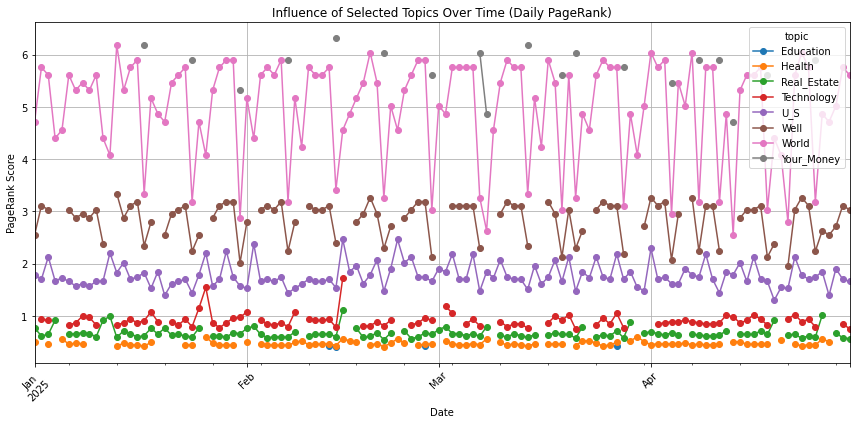

In [0]:
from pyspark.sql.functions import expr, col, lit
from graphframes import GraphFrame
import matplotlib.pyplot as plt

selected_topics = ["Technology", "Health", "Your_Money", "World", "U_S", "Education", "Real_Estate", "Well"]

trend_df = (
    pagerank_by_day
    .filter(col("id").isin(selected_topics))
    .select(col("timestamp"), col("id").alias("topic"), col("pagerank"))
)

# Convert to Pandas and pivot
trend_pd = trend_df.toPandas()
pivoted = trend_pd.pivot(index="timestamp", columns="topic", values="pagerank")

# Plot
pivoted.plot(figsize=(12, 6), marker='o')
plt.title("Influence of Selected Topics Over Time (Daily PageRank)")
plt.ylabel("PageRank Score")
plt.xlabel("Date")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

The graph shows how the influence of selected topics evolved over time based on their daily PageRank scores in the co-occurrence network. Notably:

- Technology consistently dominated the network, often reaching the highest PageRank values, indicating strong and frequent connections with other topics.

- World and U.S. also maintained relatively high and stable influence, suggesting ongoing relevance and centrality in the news landscape.

- In contrast, topics like Health, Real_Estate, and Education remained lower in influence, showing smaller and more stable PageRank scores, likely due to narrower or more focused coverage.

- The sharp fluctuations in some topics (like "Well" and "Your_Money") may reflect more episodic attention in the media.

Overall, the data highlights which topics were structurally central in daily news narratives and how that centrality shifted over time.



In [0]:
from pyspark.sql.functions import to_date

days_to_compare = ["2025-04-01", "2025-04-03"]
import pandas as pd

comparison_df = (
    pagerank_by_day
    .withColumn("date", to_date("timestamp"))
    .filter(col("date").isin(["2025-04-01", "2025-04-03"]))
    .orderBy("date", col("pagerank").desc())
    .toPandas()
)

# Ensure dates are datetime type
comparison_df["date"] = pd.to_datetime(comparison_df["date"])

# Pivot and compute difference
pivoted = comparison_df.pivot(index="id", columns="date", values="pagerank").fillna(0)

# Rename columns for convenience
pivoted.columns = [col.strftime("%Y-%m-%d") for col in pivoted.columns]

# Compute difference
pivoted["diff"] = pivoted["2025-04-03"] - pivoted["2025-04-01"]
pivoted = pivoted.sort_values(by="diff", ascending=False)

print(pivoted.head(10))


                  2025-04-01  2025-04-03      diff
id                                                
Weather             0.000000    2.236511  2.236511
Times_Insider       0.000000    1.228453  1.228453
Technology          0.000000    0.867349  0.867349
Obituaries          0.000000    0.530249  0.530249
Automobiles         0.000000    0.339333  0.339333
Food                0.413780    0.438294  0.024514
Crosswords_Games    0.398388    0.420426  0.022038
Corrections         0.384189    0.404070  0.019881
Climate             0.371048    0.389039  0.017991
Business_Day        0.358847    0.375174  0.016327



One notable shift following Trump’s tariff announcement on **April 3rd, 2025**, is the sudden emergence of the **"Times_Insider"** topic, which jumped from a PageRank score of **0.0** on April 1st to **1.23** on April 3rd.

This indicates that *The New York Times* dedicated significant behind-the-scenes reporting or editorial reflection on the announcement and its broader implications. Since "Times Insider" focuses on **meta-journalism**, explaining how stories are reported, its rise suggests that the newspaper aimed to increase transparency or provide context around political coverage during a period of heightened reader interest and policy significance.


### Analyzing Topic Centrality on April 3rd, 2025
To understand the shift in public discourse following major news such as Trump’s tariff announcement, we visualize the top 10 most central news topics by PageRank score on April 3rd, 2025. This helps identify which themes became more prominent in the media landscape on that day.

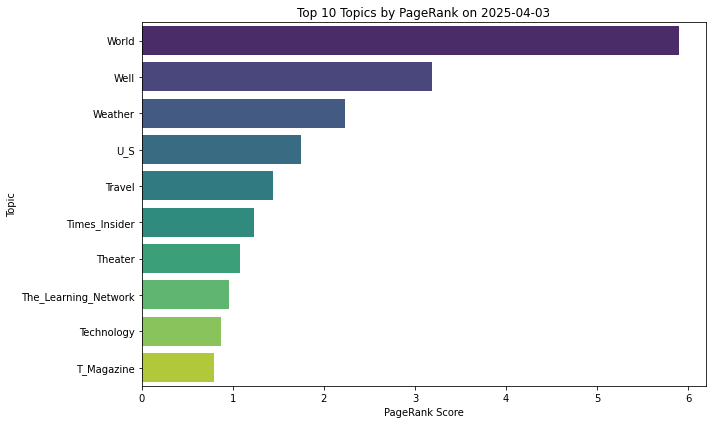

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt
from pyspark.sql.functions import to_date

# Select April 3rd topics
day = "2025-04-03"
top_topics_apr3 = (
    pagerank_by_day.withColumn("date", to_date("timestamp"))
    .filter(col("date") == day)
    .orderBy(col("pagerank").desc())
    .limit(10)
    .toPandas()
)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=top_topics_apr3, x="pagerank", y="id", palette="viridis")
plt.title(f"Top 10 Topics by PageRank on {day}")
plt.xlabel("PageRank Score")
plt.ylabel("Topic")
plt.tight_layout()
plt.show()

### Visualizing the Topic Co-occurrence Network for April 3rd, 2025
To deepen our understanding of the relationships between news topics on the day of Trump’s tariff announcement (April 3rd, 2025), we construct a co-occurrence network. Each node represents a topic that appeared in at least one article that day, and edges connect topics that co-occurred in the same time window.

We then compute PageRank scores using NetworkX and visualize the graph, where node size reflects each topic's centrality. This allows us to explore structural prominence beyond mere frequency counts.

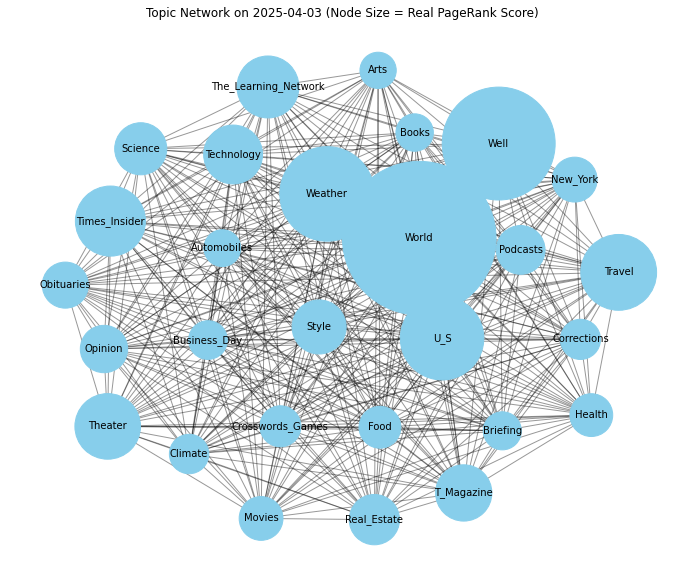

In [0]:
from pyspark.sql.functions import to_date, col
from pyspark.sql import Row
from itertools import combinations
import networkx as nx
import matplotlib.pyplot as plt

# Step 1: Select April 3rd PageRank from stored results
day = "2025-04-03"
pr_scores = (
    pagerank_by_day.withColumn("date", to_date("timestamp"))
    .filter(col("date") == day)
    .select("id", "pagerank")
    .toPandas()
    .set_index("id")["pagerank"]
    .to_dict()
)

# Step 2: Prepare topic graph based on co-occurrence
topic_cols = [c for c in merged.columns if c.startswith("count_") and c != "count_"]
melted = merged.selectExpr(
    "timestamp",
    f"stack({len(topic_cols)}, " +
    ", ".join([f"'{col[6:]}', `{col}`" for col in topic_cols]) +
    ") as (topic, value)"
)
melted_date = melted.withColumn("date", to_date("timestamp"))
topics_on_day = (
    melted_date.filter((col("date") == day) & (col("value") > 0))
    .select("topic").distinct().toPandas()["topic"].tolist()
)

if topics_on_day:
    pairs = [Row(src=a, dst=b) for a, b in combinations(sorted(topics_on_day), 2)]
    edges_df = spark.createDataFrame(pairs)
    edges_pd = edges_df.toPandas()
    
    # Build graph
    G = nx.from_pandas_edgelist(edges_pd, source="src", target="dst")
    
    # Assign node sizes using real PageRank scores
    sizes = [pr_scores.get(node, 0) * 4000 for node in G.nodes()]  # Adjust multiplier as needed

    # Plot
    plt.figure(figsize=(12, 10))
    pos = nx.spring_layout(G, seed=42)
    nx.draw_networkx_nodes(G, pos, node_size=sizes, node_color='skyblue')
    nx.draw_networkx_edges(G, pos, alpha=0.4)
    nx.draw_networkx_labels(G, pos, font_size=10)
    plt.title(f"Topic Network on {day} (Node Size = Real PageRank Score)")
    plt.axis('off')
    plt.show()
else:
    print(f"No topics found for {day}")


# 6. Exploratory Data Analysis (EDA)

In this section, we explore the structure and trends of the merged dataset. This includes:

- Volume of news over time
- Most common topics and their evolution
- Sentiment patterns by topic
- Visual correlations between news features and stock movements

This analysis will help us understand whether certain topics or sentiment shifts precede changes in the SPY index.


In [0]:
## Code :)

# 7. Machine Learning

Here, we prepare our dataset for modeling and evaluate the potential of our features to predict market behavior. This includes:

- Feature selection (e.g., TF-IDF, sentiment, topic counts)
- Data splitting (training/test sets)
- Evaluation setup

We explore the predictive signal embedded in the news features before moving to formal modeling.


## Stock Data

In [0]:
#re-imports to keep test seperated
import mlflow
import mlflow.spark
from pyspark.sql.window import Window
from pyspark.sql.functions import lead
from pyspark.ml import Pipeline
from pyspark.ml.feature import VectorAssembler, StandardScaler
from pyspark.ml.regression import GBTRegressor
from xgboost.spark import SparkXGBRegressor
from pyspark.ml.evaluation import RegressionEvaluator

# Load the stock-only dataset
stock_only_df = spark.table("stock_daily")

# Add target variable: next-day close
wSpec = Window.orderBy("timestamp")
df = stock_only_df.withColumn("label", lead("close", 1).over(wSpec)).na.drop(subset=["label"])

# Define features from stock data only
stock_features = [
    "open", "high", "low", "close"
]

# Assemble and scale features
assembler = VectorAssembler(inputCols=stock_features, outputCol="raw_features")
scaler    = StandardScaler(inputCol="raw_features", outputCol="features", withMean=True, withStd=True)

# Train-test split
train_df, test_df = df.randomSplit([0.8, 0.2], seed=42)

# Set up evaluator
evaluator = RegressionEvaluator(labelCol="label", predictionCol="prediction", metricName="rmse")


## Stock + News Data

In [0]:
import mlflow
import mlflow.spark
from pyspark.sql.window import Window
from pyspark.sql.functions import lead
from pyspark.ml import Pipeline
from pyspark.ml.feature import VectorAssembler, StandardScaler
from pyspark.ml.regression import GBTRegressor
from xgboost.spark import SparkXGBRegressor
from pyspark.ml.evaluation import RegressionEvaluator

# -----------------------------------------------------------------------------------
# 1) Load the merged stock+news TF-IDF table
# -----------------------------------------------------------------------------------
merged_df = spark.table("stock_news_merged")

# -----------------------------------------------------------------------------------
# 2) Add “label” = next-day close price
#    We assume 'close' is in merged_df. We use a Window over 'timestamp' to lead(close,1).
# -----------------------------------------------------------------------------------


w = Window.orderBy("timestamp")
merged_df = (
    merged_df
      .withColumn("label", lead("close", 1).over(w))
      # drop any rows where label is null (i.e. last row)
      .na.drop(subset=["label"])
)

# -----------------------------------------------------------------------------------
# 3) Identify feature columns
#
#    We want to take *all* numeric inputs from merged_df (both stock columns and news TF-IDF columns).
#    We only need to exclude:
#      - the raw “timestamp” column
#      - the newly created “label”
#    Everything else in `df.columns` will be treated as an input feature.
# -----------------------------------------------------------------------------------
exclude_cols = {"timestamp", "label"}
feature_cols = [c for c in merged_df.columns if c not in exclude_cols]

# Quick sanity‐check: 
#   print("Features will be:", feature_cols)
#   # you should see e.g. ["open","high","low","close","volume", <all the tfidf_* columns>…]
# -----------------------------------------------------------------------------------

# -----------------------------------------------------------------------------------
# 4) Assemble + scale
# -----------------------------------------------------------------------------------

# 3) If a previous run already created "raw_features", drop it:
if "raw_features" in merged_df.columns:
    merged_df = merged_df.drop("raw_features")


assembler = VectorAssembler(inputCols=feature_cols, outputCol="raw_features")
scaler    = StandardScaler(inputCol="raw_features", outputCol="features", withMean=True, withStd=True)

# -----------------------------------------------------------------------------------
# 5) Train/Test split
# -----------------------------------------------------------------------------------
train_df, test_df = merged_df.randomSplit([0.8, 0.2], seed=42)

evaluator = RegressionEvaluator(
    labelCol="label",
    predictionCol="prediction",
    metricName="rmse"
)


# 8. Predictive Modeling

In this section, we implement machine learning models to predict the target variable (e.g., SPY return direction). We focus on:

- XGBoost model training
- Feature importance analysis
- Model performance evaluation (e.g., accuracy, precision, ROC-AUC)

The goal is to identify which news-driven features are most predictive of market movement.


## Stock Data

In [0]:
from pyspark.ml.regression import GBTRegressor
from xgboost.spark import SparkXGBRegressor

# Enable MLflow autologging
mlflow.spark.autolog()

# --- GBT MODEL ---
with mlflow.start_run(run_name="GBT_Stock_Only") as run:
    gbt = GBTRegressor(featuresCol="features", labelCol="label", maxIter=50, maxDepth=5)
    pipeline_gbt = Pipeline(stages=[assembler, scaler, gbt])
    model_gbt = pipeline_gbt.fit(train_df)

    preds_gbt = model_gbt.transform(test_df)
    rmse_gbt = evaluator.evaluate(preds_gbt)
    mlflow.log_metric("rmse", rmse_gbt)
    print(f"✅ GBT RMSE (Stock-Only): {rmse_gbt:.4f}")

# --- XGBOOST MODEL ---
with mlflow.start_run(run_name="XGB_Stock_Only") as run:
    xgb = SparkXGBRegressor(
        features_col="features",
        label_col="label",
        objective="reg:squarederror",
        num_round=100,
        max_depth=5,
        eta=0.1
    )
    pipeline_xgb = Pipeline(stages=[assembler, scaler, xgb])
    model_xgb = pipeline_xgb.fit(train_df)

    preds_xgb = model_xgb.transform(test_df)
    rmse_xgb = evaluator.evaluate(preds_xgb)
    mlflow.log_metric("rmse", rmse_xgb)
    print(f"✅ XGBoost RMSE (Stock-Only): {rmse_xgb:.4f}")


2025/06/03 09:57:54 WARNING mlflow.spark: With Pyspark >= 3.2, PYSPARK_PIN_THREAD environment variable must be set to false for Spark datasource autologging to work.


✅ GBT RMSE (Stock-Only): 14.5359


INFO:XGBoost-PySpark:Running xgboost-2.1.4 on 1 workers with
	booster params: {'objective': 'reg:squarederror', 'device': 'cpu', 'max_depth': 5, 'num_round': 100, 'eta': 0.1, 'nthread': 1}
	train_call_kwargs_params: {'verbose_eval': True, 'num_boost_round': 100}
	dmatrix_kwargs: {'nthread': 1, 'missing': nan}
INFO:XGBoost-PySpark:Finished xgboost training!


✅ XGBoost RMSE (Stock-Only): 13.5674


## Stock + News Data

In [0]:
from pyspark.ml.regression import GBTRegressor
from xgboost.spark import SparkXGBRegressor

# Enable MLflow autologging
mlflow.spark.autolog()

# --- XGBOOST MODEL ---
with mlflow.start_run(run_name="XGB_Merged") as run:
    xgb = SparkXGBRegressor(
        features_col="features",
        label_col="label",
        objective="reg:squarederror",
        num_round=100,
        max_depth=5,
        eta=0.1
    )
    pipeline_xgb = Pipeline(stages=[assembler, scaler, xgb])
    model_xgb = pipeline_xgb.fit(train_df)

    preds_xgb = model_xgb.transform(test_df)
    rmse_xgb = evaluator.evaluate(preds_xgb)
    mlflow.log_metric("rmse", rmse_xgb)
    print(f"✅ XGBoost RMSE (Merged): {rmse_xgb:.4f}")


2025/06/03 20:25:20 WARNING mlflow.spark: With Pyspark >= 3.2, PYSPARK_PIN_THREAD environment variable must be set to false for Spark datasource autologging to work.
2025/06/03 20:25:20 INFO mlflow.spark.autologging: Autologging successfully enabled for spark.
2025-06-03 20:26:00,400 INFO XGBoost-PySpark: _fit Running xgboost-2.1.4 on 1 workers with
	booster params: {'objective': 'reg:squarederror', 'device': 'cpu', 'max_depth': 5, 'num_round': 100, 'eta': 0.1, 'nthread': 1}
	train_call_kwargs_params: {'verbose_eval': True, 'num_boost_round': 100}
	dmatrix_kwargs: {'nthread': 1, 'missing': nan}
2025-06-03 20:27:30,142 INFO XGBoost-PySpark: _fit Finished xgboost training!


✅ XGBoost RMSE (Merged): 9.9030


# 9. Insights and Conclusions

We wrap up the notebook with a summary of key takeaways, including:

- Which topics or sentiment patterns were most impactful
- Whether TF-IDF or sentiment contributed more predictive power
- Business or market relevance of findings
- Limitations of the analysis (e.g., no ground-truth sentiment labels, time granularity)
- Ideas for future work (e.g., real-time pipeline, fine-tuned sentiment models)

This section helps contextualize the value of the analysis and where it could go next.


## Stock Data


=== GBTRegressor Metrics ===
MAE : 9.3910
RMSE: 14.5359
R2  : 0.7137

=== XGBRegressor Metrics ===
MAE : 7.3010
RMSE: 13.5674
R2  : 0.7506


/databricks/spark/python/pyspark/sql/pandas/conversion.py:122: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Unable to convert the field raw_features. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Direct cause: Unsupported type in conversion to Arrow: VectorUDT()
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
  warn(msg)
/databricks/spark/python/pyspark/sql/pandas/conversion.py:122: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Unable to convert the field raw_features. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Direct cause: Unsupported type in conversion to Arrow: Vector

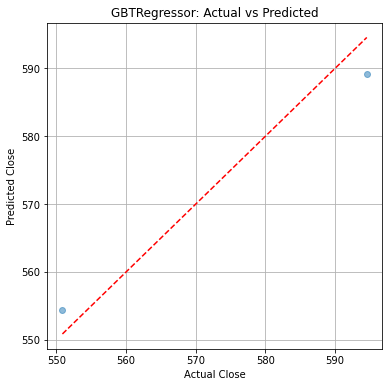

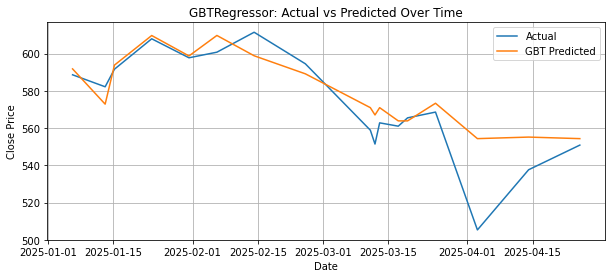

In [0]:
import matplotlib.pyplot as plt
from pyspark.sql.functions import col, expr, avg, sum as spark_sum
from pyspark.sql import DataFrame

def compute_metrics(preds: DataFrame, model_name: str):
    # Add residual column
    preds = preds.withColumn("residual", col("prediction") - col("label"))
    
    # MAE and RMSE
    metrics_row = preds.select(
        expr("avg(abs(residual))").alias("MAE"),
        expr("sqrt(avg(residual * residual))").alias("RMSE")
    ).first()
    mae  = metrics_row["MAE"]
    rmse = metrics_row["RMSE"]
    
    # R2: compute mean(label) first
    mean_label = preds.select(avg("label")).first()[0]
    
    # SSE and SST
    sse = preds.select(spark_sum((col("label") - col("prediction"))**2)).first()[0]
    sst = preds.select(spark_sum((col("label") - mean_label)**2)).first()[0]
    r2  = 1 - sse / sst if sst != 0 else None
    
    print(f"\n=== {model_name} Metrics ===")
    print(f"MAE : {mae:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"R2  : {r2:.4f}" if r2 is not None else "R2: undefined (zero variance in labels)")
    
    return preds

preds_gbt = compute_metrics(preds_gbt, "GBTRegressor")
preds_xgb = compute_metrics(preds_xgb, "XGBRegressor")

# Sample down for plotting
sample_gbt = preds_gbt.sample(fraction=0.2, seed=42).toPandas()
sample_xgb = preds_xgb.sample(fraction=0.2, seed=42).toPandas()

# Actual vs Predicted scatter
for df, name in [(sample_gbt, "GBTRegressor")]:
    plt.figure(figsize=(6,6))
    plt.scatter(df["label"], df["prediction"], alpha=0.5)
    mn, mx = df["label"].min(), df["label"].max()
    plt.plot([mn, mx], [mn, mx], "r--")
    plt.title(f"{name}: Actual vs Predicted")
    plt.xlabel("Actual Close")
    plt.ylabel("Predicted Close")
    plt.grid()
    plt.show()

# Time-series overlay
if "timestamp" in preds_gbt.columns:
    ts_pd = preds_gbt.select("timestamp","label","prediction") \
        .orderBy("timestamp") \
        .toPandas()
    plt.figure(figsize=(10,4))
    plt.plot(ts_pd["timestamp"], ts_pd["label"], label="Actual")
    plt.plot(ts_pd["timestamp"], ts_pd["prediction"], label="GBT Predicted")
    plt.title("GBTRegressor: Actual vs Predicted Over Time")
    plt.xlabel("Date")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()


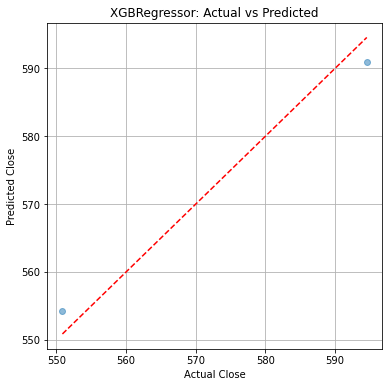

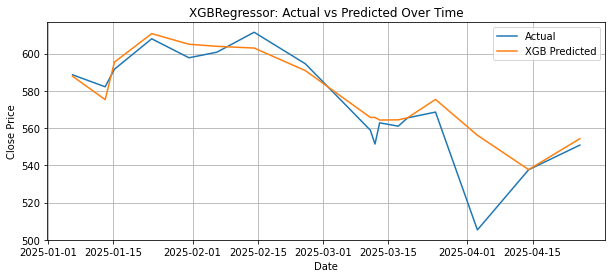

In [0]:
# Actual vs Predicted scatter
for df, name in [(sample_xgb, "XGBRegressor")]:
    plt.figure(figsize=(6,6))
    plt.scatter(df["label"], df["prediction"], alpha=0.5)
    mn, mx = df["label"].min(), df["label"].max()
    plt.plot([mn, mx], [mn, mx], "r--")
    plt.title(f"{name}: Actual vs Predicted")
    plt.xlabel("Actual Close")
    plt.ylabel("Predicted Close")
    plt.grid()
    plt.show()

# Time-series overlay
if "timestamp" in preds_xgb.columns:
    ts_pd = preds_xgb.select("timestamp","label","prediction") \
        .orderBy("timestamp") \
        .toPandas()
    plt.figure(figsize=(10,4))
    plt.plot(ts_pd["timestamp"], ts_pd["label"], label="Actual")
    plt.plot(ts_pd["timestamp"], ts_pd["prediction"], label="XGB Predicted")
    plt.title("XGBRegressor: Actual vs Predicted Over Time")
    plt.xlabel("Date")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

### Feature Importance

Gain

feature,importance
low,734.973388671875
close,51.14740753173828
open,46.91270446777344
high,19.938884735107422


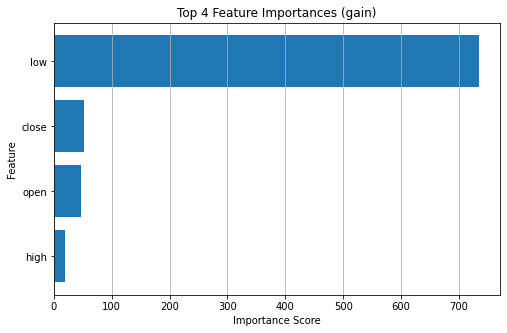

In [0]:
import pandas as pd
import matplotlib.pyplot as plt

# 1) Grab the fitted XGBoost stage from your pipeline
xgb_stage = model_xgb.stages[-1]

# 2) Retrieve the native Booster via get_booster()
booster = xgb_stage.get_booster()

# 3) Choose importance metric (e.g. “gain”, “weight”, or “cover”)
importance_type = "gain"

raw_importance = booster.get_score(importance_type=importance_type)

# 5) Map indices “f#” → your original feature names
feature_names = assembler.getInputCols()
importance_list = []
for f_key, score in raw_importance.items():
    # f_key looks like "f0", "f1", etc.
    idx = int(f_key[1:])            # strip the leading “f” to get integer index
    if idx < len(feature_names):
        importance_list.append((feature_names[idx], float(score)))

# 6) Build a Pandas DataFrame and sort descending
imp_df = pd.DataFrame(importance_list, columns=["feature", "importance"])
imp_df = imp_df.sort_values("importance", ascending=False).reset_index(drop=True)

# 7) Display as a Spark DataFrame in Databricks
display(spark.createDataFrame(imp_df))

# 8) (Optional) Plot top 10
top_n = min(10, len(imp_df))
top_imp = imp_df.head(top_n)
plt.figure(figsize=(8, 5))
plt.barh(top_imp["feature"][::-1], top_imp["importance"][::-1])
plt.title(f"Top {top_n} Feature Importances ({importance_type})")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.grid(axis="x")
plt.show()


Weight

feature,importance
open,678.0
low,332.0
close,251.0
high,250.0


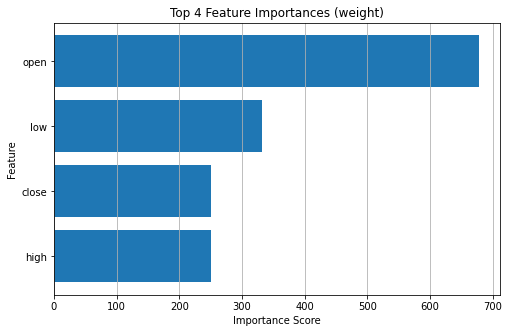

In [0]:
# 3) Choose importance metric (e.g. “gain”, “weight”, or “cover”)
importance_type = "weight"

raw_importance = booster.get_score(importance_type=importance_type)

# 5) Map indices “f#” → your original feature names
feature_names = assembler.getInputCols()
importance_list = []
for f_key, score in raw_importance.items():
    # f_key looks like "f0", "f1", etc.
    idx = int(f_key[1:])            # strip the leading “f” to get integer index
    if idx < len(feature_names):
        importance_list.append((feature_names[idx], float(score)))

# 6) Build a Pandas DataFrame and sort descending
imp_df = pd.DataFrame(importance_list, columns=["feature", "importance"])
imp_df = imp_df.sort_values("importance", ascending=False).reset_index(drop=True)

# 7) Display as a Spark DataFrame in Databricks
display(spark.createDataFrame(imp_df))

# 8) (Optional) Plot top 10
top_n = min(10, len(imp_df))
top_imp = imp_df.head(top_n)
plt.figure(figsize=(8, 5))
plt.barh(top_imp["feature"][::-1], top_imp["importance"][::-1])
plt.title(f"Top {top_n} Feature Importances ({importance_type})")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.grid(axis="x")
plt.show()


Cover

feature,importance
low,29.876506805419922
close,21.52988052368164
high,19.09600067138672
open,13.146018028259277


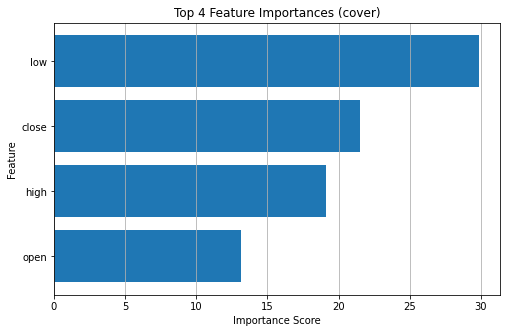

In [0]:
# 3) Choose importance metric (e.g. “gain”, “weight”, or “cover”)
importance_type = "cover"

raw_importance = booster.get_score(importance_type=importance_type)

# 5) Map indices “f#” → your original feature names
feature_names = assembler.getInputCols()
importance_list = []
for f_key, score in raw_importance.items():
    # f_key looks like "f0", "f1", etc.
    idx = int(f_key[1:])            # strip the leading “f” to get integer index
    if idx < len(feature_names):
        importance_list.append((feature_names[idx], float(score)))

# 6) Build a Pandas DataFrame and sort descending
imp_df = pd.DataFrame(importance_list, columns=["feature", "importance"])
imp_df = imp_df.sort_values("importance", ascending=False).reset_index(drop=True)

# 7) Display as a Spark DataFrame in Databricks
display(spark.createDataFrame(imp_df))

# 8) (Optional) Plot top 10
top_n = min(10, len(imp_df))
top_imp = imp_df.head(top_n)
plt.figure(figsize=(8, 5))
plt.barh(top_imp["feature"][::-1], top_imp["importance"][::-1])
plt.title(f"Top {top_n} Feature Importances ({importance_type})")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.grid(axis="x")
plt.show()


## Stock + News Data

In [0]:
import matplotlib.pyplot as plt
from pyspark.sql.functions import col, expr, avg, sum as spark_sum
from pyspark.sql import DataFrame

def compute_metrics(preds: DataFrame, model_name: str):
    # Add residual column
    preds = preds.withColumn("residual", col("prediction") - col("label"))
    
    # MAE and RMSE
    metrics_row = preds.select(
        expr("avg(abs(residual))").alias("MAE"),
        expr("sqrt(avg(residual * residual))").alias("RMSE")
    ).first()
    mae  = metrics_row["MAE"]
    rmse = metrics_row["RMSE"]
    
    # R2: compute mean(label) first
    mean_label = preds.select(avg("label")).first()[0]
    
    # SSE and SST
    sse = preds.select(spark_sum((col("label") - col("prediction"))**2)).first()[0]
    sst = preds.select(spark_sum((col("label") - mean_label)**2)).first()[0]
    r2  = 1 - sse / sst if sst != 0 else None
    
    print(f"\n=== {model_name} Metrics ===")
    print(f"MAE : {mae:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"R2  : {r2:.4f}" if r2 is not None else "R2: undefined (zero variance in labels)")
    
    return preds


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3886301877404304>:32
     28     print(f"R2  : {r2:.4f}" if r2 is not None else "R2: undefined (zero variance in labels)")
     30     return preds
---> 32 preds_gbt = compute_metrics(preds_gbt, "GBTRegressor")
     33 preds_xgb = compute_metrics(preds_xgb, "XGBRegressor")
     35 # Sample down for plotting

NameError: name 'preds_gbt' is not defined


=== XGBRegressor Metrics ===
MAE : 6.9987
RMSE: 9.9030
R2  : 0.8671


/databricks/spark/python/pyspark/sql/pandas/conversion.py:122: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Unable to convert the field tfidf_. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Direct cause: Unsupported type in conversion to Arrow: VectorUDT()
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
  warn(msg)


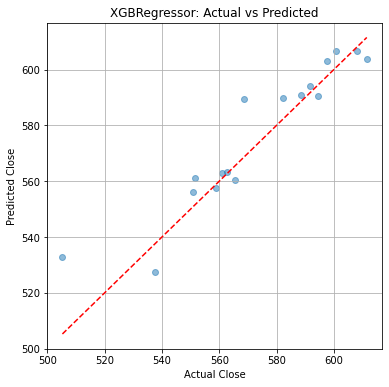

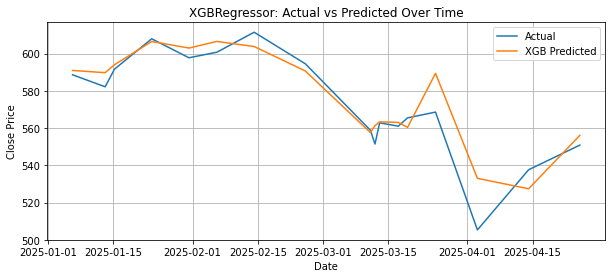

In [0]:
preds_xgb = compute_metrics(preds_xgb, "XGBRegressor")

#sample_xgb = preds_xgb.sample(fraction=0.2, seed=42).toPandas()

# Actual vs Predicted scatter
for df, name in [(preds_xgb.toPandas(), "XGBRegressor")]:
    plt.figure(figsize=(6,6))
    plt.scatter(df["label"], df["prediction"], alpha=0.5)
    mn, mx = df["label"].min(), df["label"].max()
    plt.plot([mn, mx], [mn, mx], "r--")
    plt.title(f"{name}: Actual vs Predicted")
    plt.xlabel("Actual Close")
    plt.ylabel("Predicted Close")
    plt.grid()
    plt.show()

# Time-series overlay
if "timestamp" in preds_xgb.columns:
    ts_pd = preds_xgb.select("timestamp","label","prediction") \
        .orderBy("timestamp") \
        .toPandas()
    plt.figure(figsize=(10,4))
    plt.plot(ts_pd["timestamp"], ts_pd["label"], label="Actual")
    plt.plot(ts_pd["timestamp"], ts_pd["prediction"], label="XGB Predicted")
    plt.title("XGBRegressor: Actual vs Predicted Over Time")
    plt.xlabel("Date")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

### Feature Importance

Gain

feature,importance
low,1956.273193359375
vwap,1251.9969482421875
open,72.38814544677734
close,59.17497634887695
count_Weather,29.03989601135254
count_Well,20.736831665039062
count_Podcasts,12.654296875
trade_count,11.517778396606445
count_U_S,4.694694519042969
count_Books,4.405026435852051


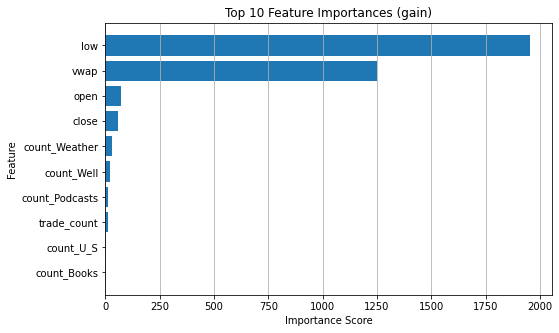

In [0]:
import pandas as pd
import matplotlib.pyplot as plt

# 1) Grab the fitted XGBoost stage from your pipeline
xgb_stage = model_xgb.stages[-1]

# 2) Retrieve the native Booster via get_booster()
booster = xgb_stage.get_booster()

# 3) Choose importance metric (e.g. “gain”, “weight”, or “cover”)
importance_type = "gain"

raw_importance = booster.get_score(importance_type=importance_type)

# 5) Map indices “f#” → your original feature names
feature_names = assembler.getInputCols()
importance_list = []
for f_key, score in raw_importance.items():
    # f_key looks like "f0", "f1", etc.
    idx = int(f_key[1:])            # strip the leading “f” to get integer index
    if idx < len(feature_names):
        importance_list.append((feature_names[idx], float(score)))

# 6) Build a Pandas DataFrame and sort descending
imp_df = pd.DataFrame(importance_list, columns=["feature", "importance"])
imp_df = imp_df.sort_values("importance", ascending=False).reset_index(drop=True)

# 7) Display as a Spark DataFrame in Databricks
display(spark.createDataFrame(imp_df))

# 8) (Optional) Plot top 10
top_n = min(10, len(imp_df))
top_imp = imp_df.head(top_n)
plt.figure(figsize=(8, 5))
plt.barh(top_imp["feature"][::-1], top_imp["importance"][::-1])
plt.title(f"Top {top_n} Feature Importances ({importance_type})")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.grid(axis="x")
plt.show()


Weight

feature,importance
close,200.0
low,119.0
count_Arts,39.0
high,37.0
trade_count,30.0
vwap,26.0
volume,25.0
open,14.0
count_Climate,13.0
count_Well,8.0


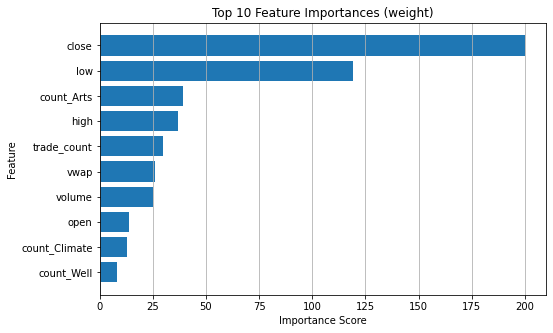

In [0]:
# 3) Choose importance metric (e.g. “gain”, “weight”, or “cover”)
importance_type = "weight"

raw_importance = booster.get_score(importance_type=importance_type)

# 5) Map indices “f#” → your original feature names
feature_names = assembler.getInputCols()
importance_list = []
for f_key, score in raw_importance.items():
    # f_key looks like "f0", "f1", etc.
    idx = int(f_key[1:])            # strip the leading “f” to get integer index
    if idx < len(feature_names):
        importance_list.append((feature_names[idx], float(score)))

# 6) Build a Pandas DataFrame and sort descending
imp_df = pd.DataFrame(importance_list, columns=["feature", "importance"])
imp_df = imp_df.sort_values("importance", ascending=False).reset_index(drop=True)

# 7) Display as a Spark DataFrame in Databricks
display(spark.createDataFrame(imp_df))

# 8) (Optional) Plot top 10
top_n = min(10, len(imp_df))
top_imp = imp_df.head(top_n)
plt.figure(figsize=(8, 5))
plt.barh(top_imp["feature"][::-1], top_imp["importance"][::-1])
plt.title(f"Top {top_n} Feature Importances ({importance_type})")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.grid(axis="x")
plt.show()


Cover

feature,importance
low,59.49580001831055
vwap,31.115385055541992
high,26.189189910888672
trade_count,25.366666793823242
count_Opinion,23.0
count_New_York,21.5
open,21.214284896850586
count_Podcasts,20.0
close,18.549999237060547
count_Magazine,18.0


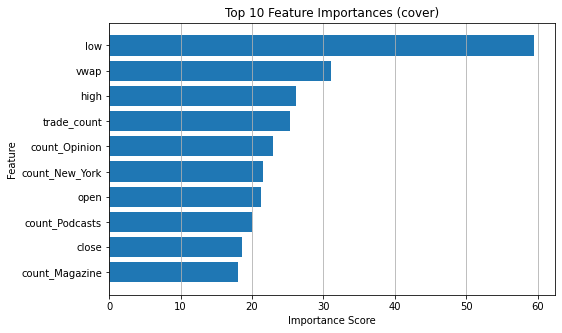

In [0]:
# 3) Choose importance metric (e.g. “gain”, “weight”, or “cover”)
importance_type = "cover"

raw_importance = booster.get_score(importance_type=importance_type)

# 5) Map indices “f#” → your original feature names
feature_names = assembler.getInputCols()
importance_list = []
for f_key, score in raw_importance.items():
    # f_key looks like "f0", "f1", etc.
    idx = int(f_key[1:])            # strip the leading “f” to get integer index
    if idx < len(feature_names):
        importance_list.append((feature_names[idx], float(score)))

# 6) Build a Pandas DataFrame and sort descending
imp_df = pd.DataFrame(importance_list, columns=["feature", "importance"])
imp_df = imp_df.sort_values("importance", ascending=False).reset_index(drop=True)

# 7) Display as a Spark DataFrame in Databricks
display(spark.createDataFrame(imp_df))

# 8) (Optional) Plot top 10
top_n = min(10, len(imp_df))
top_imp = imp_df.head(top_n)
plt.figure(figsize=(8, 5))
plt.barh(top_imp["feature"][::-1], top_imp["importance"][::-1])
plt.title(f"Top {top_n} Feature Importances ({importance_type})")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.grid(axis="x")
plt.show()
